In [66]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
%matplotlib inline

from sklearn import datasets, linear_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error,mean_absolute_percentage_error

from numpy import arange
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score


from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge

from sklearn.tree import DecisionTreeClassifier # to build a classification tree
from sklearn.model_selection import train_test_split # to split data into training and testing sets
from sklearn.model_selection import cross_val_score # for cross validation
from sklearn.metrics import confusion_matrix, classification_report # to create a confusion matrix and classification report
from sklearn.metrics import ConfusionMatrixDisplay # to draw a confusion matrix
from sklearn.tree import plot_tree # to draw a classification tree
from sklearn.metrics import precision_score, recall_score # to calculate the performance metrics
from sklearn.metrics import roc_curve, roc_auc_score # to calculate the performance metrics
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
import statsmodels
import statsmodels.api as sm
import statsmodels.formula.api as smf

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

In [67]:
df = pd.read_csv('college_data.csv')
df.head()

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,Yes,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60
1,Yes,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56
2,Yes,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54
3,Yes,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59
4,Yes,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15


In [68]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 777 entries, 0 to 776
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Private      777 non-null    object 
 1   Apps         777 non-null    int64  
 2   Accept       777 non-null    int64  
 3   Enroll       777 non-null    int64  
 4   Top10perc    777 non-null    int64  
 5   Top25perc    777 non-null    int64  
 6   F.Undergrad  777 non-null    int64  
 7   P.Undergrad  777 non-null    int64  
 8   Outstate     777 non-null    int64  
 9   Room.Board   777 non-null    int64  
 10  Books        777 non-null    int64  
 11  Personal     777 non-null    int64  
 12  PhD          777 non-null    int64  
 13  Terminal     777 non-null    int64  
 14  S.F.Ratio    777 non-null    float64
 15  perc.alumni  777 non-null    int64  
 16  Expend       777 non-null    int64  
 17  Grad.Rate    777 non-null    int64  
dtypes: float64(1), int64(16), object(1)
memory usage: 

In [69]:
df.describe()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
count,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.00000
mean,3001.638353,2018.804376,779.972973,27.558559,55.796654,3699.907336,855.298584,10440.669241,4357.526384,549.380952,1340.642214,72.660232,79.702703,14.089704,22.743887,9660.171171,65.46332
std,3870.201484,2451.113971,929.176190,17.640364,19.804778,4850.420531,1522.431887,4023.016484,1096.696416,165.105360,677.071454,16.328155,14.722359,3.958349,12.391801,5221.768440,17.17771
min,81.000000,72.000000,35.000000,1.000000,9.000000,139.000000,1.000000,2340.000000,1780.000000,96.000000,250.000000,8.000000,24.000000,2.500000,0.000000,3186.000000,10.00000
25%,776.000000,604.000000,242.000000,15.000000,41.000000,992.000000,95.000000,7320.000000,3597.000000,470.000000,850.000000,62.000000,71.000000,11.500000,13.000000,6751.000000,53.00000
50%,1558.000000,1110.000000,434.000000,23.000000,54.000000,1707.000000,353.000000,9990.000000,4200.000000,500.000000,1200.000000,75.000000,82.000000,13.600000,21.000000,8377.000000,65.00000
75%,3624.000000,2424.000000,902.000000,35.000000,69.000000,4005.000000,967.000000,12925.000000,5050.000000,600.000000,1700.000000,85.000000,92.000000,16.500000,31.000000,10830.000000,78.00000
max,48094.000000,26330.000000,6392.000000,96.000000,100.000000,31643.000000,21836.000000,21700.000000,8124.000000,2340.000000,6800.000000,103.000000,100.000000,39.800000,64.000000,56233.000000,118.00000


In [70]:
dummies = pd.get_dummies(df['Private'], prefix="Private")
df = pd.concat([df, dummies], axis=1)
df.drop(columns=['Private'], axis=1, inplace=True)
df.head()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate,Private_No,Private_Yes
0,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60,False,True
1,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56,False,True
2,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54,False,True
3,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59,False,True
4,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15,False,True


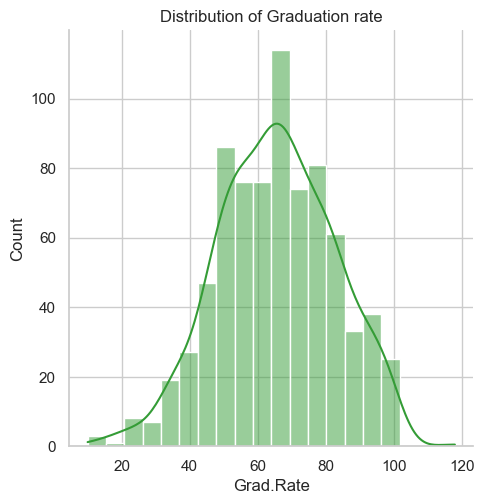

In [71]:
#Quick distribution plot
sns.set_theme(style='whitegrid', palette='pastel')
sns.displot(df['Grad.Rate'], color='#349C36', kde=True)
plt.title('Distribution of Graduation rate')
plt.show()

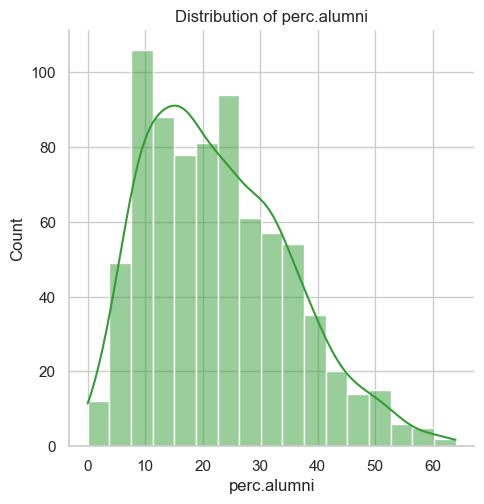

In [72]:
#Quick distribution plot
sns.set_theme(style='whitegrid', palette='pastel')
sns.displot(df['perc.alumni'], color='#349C36', kde=True)
plt.title('Distribution of perc.alumni')
plt.show()

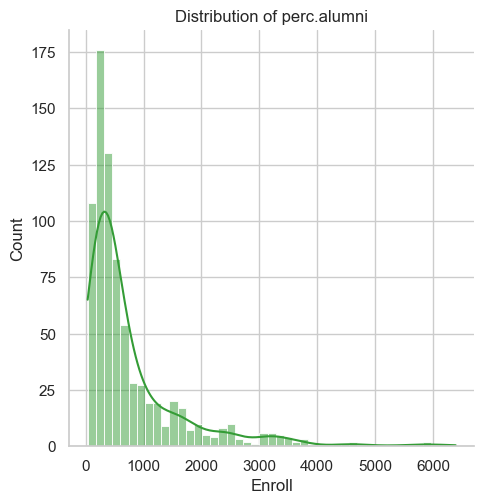

In [73]:
#Quick distribution plot 
sns.set_theme(style='whitegrid', palette='pastel')
sns.displot(df['Enroll'], color='#349C36', kde=True)
plt.title('Distribution of perc.alumni')
plt.show()

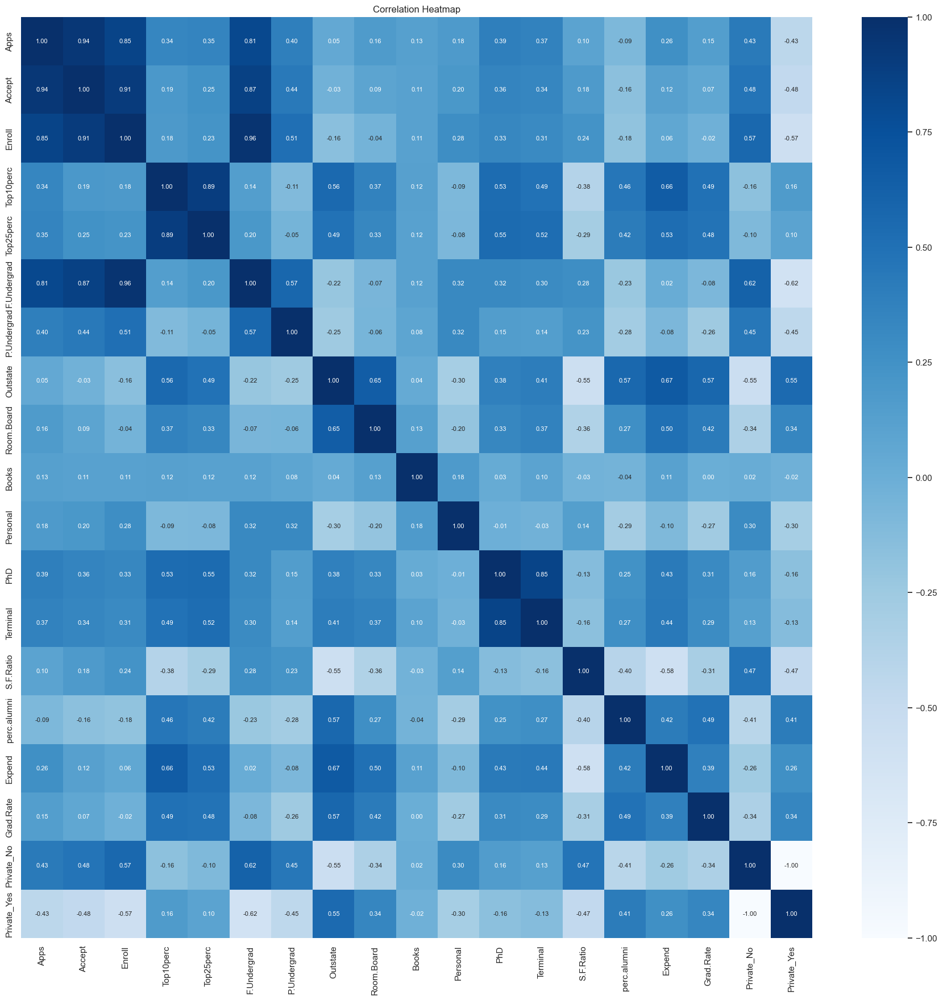

In [78]:
#Correlation Heatmap
f, ax = plt.subplots(figsize=(20, 20))
corr = df.corr()
corr['Grad.Rate'].sort_values(ascending=False)
sns.heatmap(corr, annot=True, fmt='.2f', annot_kws={'fontsize': 8}, cmap='Blues')
plt.title('Correlation Heatmap', fontsize=12)
plt.show()

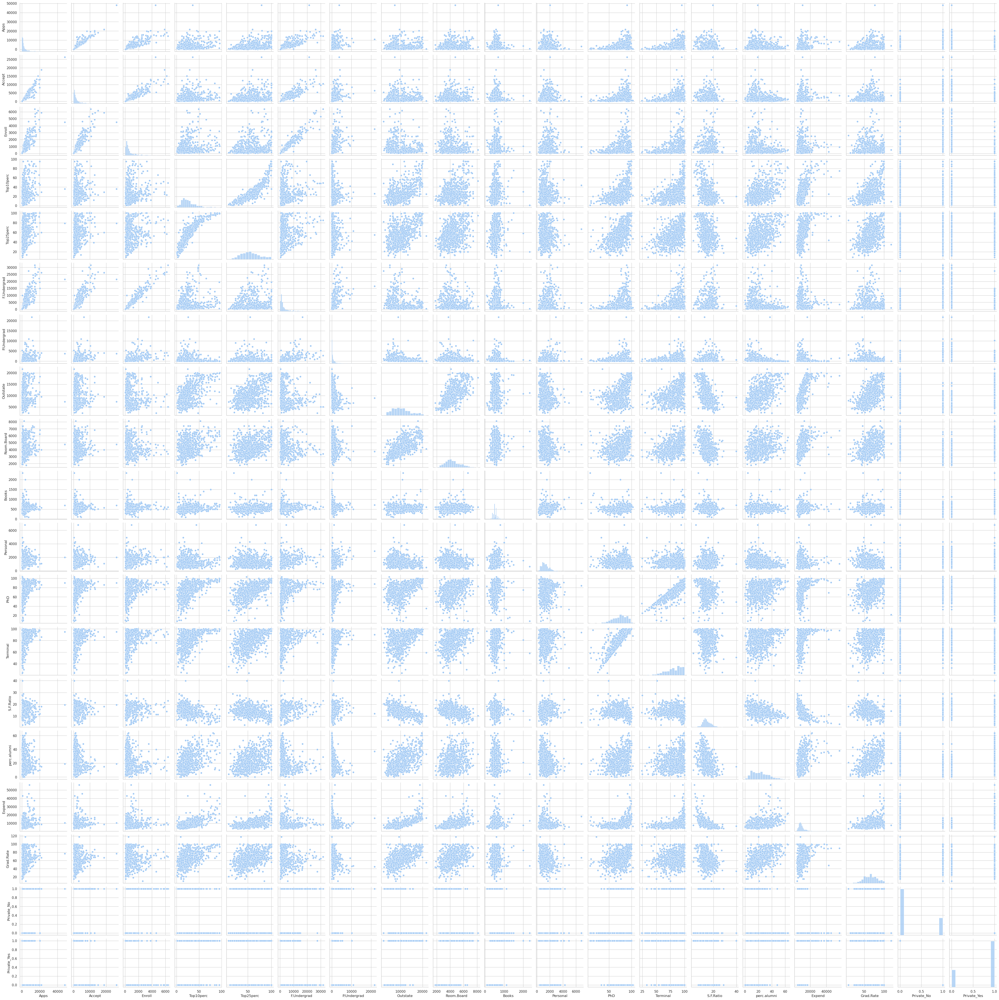

In [15]:
sns.pairplot(df)
plt.show()

In [18]:
#Generating a list of all the variables with a correlation score over .3
corr = df.corr()
high_corr_vars = corr['Grad.Rate'].loc[corr['Grad.Rate'] >= 0.3].index.to_list()
print(high_corr_vars)

['Top10perc', 'Top25perc', 'Outstate', 'Room.Board', 'PhD', 'perc.alumni', 'Expend', 'Grad.Rate', 'Private_Yes']


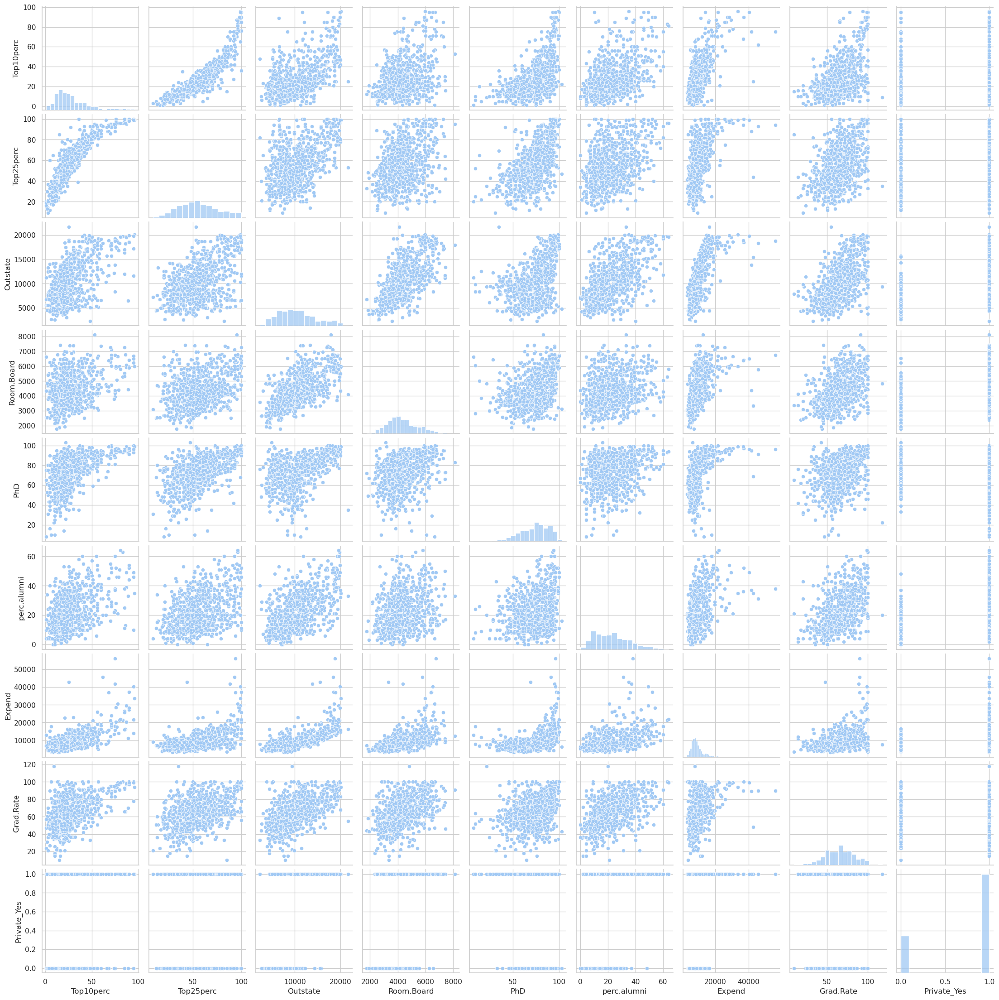

In [19]:
#pair plots for variables with high correlation
sns.set_theme(style='whitegrid', palette='pastel')
sns.pairplot(df[high_corr_vars])
plt.show()

In [79]:
savedGradRate = df["Grad.Rate"]

In [80]:
print(df["Grad.Rate"].mean())
df['Grad.Rate'] = np.where( df["Grad.Rate"] > df["Grad.Rate"].mean(), 1, 0)
df["Grad.Rate"]

65.46332046332046


0      0
1      0
2      0
3      0
4      0
      ..
772    0
773    1
774    0
775    1
776    1
Name: Grad.Rate, Length: 777, dtype: int32

In [81]:
X = df.drop('Grad.Rate', axis = 1) #keep features only for X
y = df['Grad.Rate'] #keep target variable only for y

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [82]:
sc = StandardScaler()

In [83]:
sc.fit(X_train)

#transform the train data
X_train_sc = sc.transform(X_train)
X_train_sc = pd.DataFrame(X_train_sc, columns=X_train.columns)

#transform the test data
X_test_sc = sc.transform(X_test)
X_test_sc = pd.DataFrame(X_test_sc, columns=X_test.columns)

In [84]:
# Replacing with scaled test/train predictors 
X_train = X_train_sc
X_test = X_test_sc

In [85]:
y_train = y_train.reset_index(drop=True) 
X_train = X_train.reset_index(drop=True)

### Decision Tree:

In [35]:
dt_base = DecisionTreeClassifier(random_state=21)
dt_base.fit(X_train, y_train)
path = dt_base.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities
model_pred = dt_base.predict(X_train)

In [36]:
score = dt_base.score(X_train, y_train) * 100
print(f'{score:.2f}')

100.00


In [37]:
precision = precision_score(y_train, model_pred) * 100
print(f'{precision:.2f}')

100.00


In [38]:
recall = recall_score(y_train, model_pred) * 100
print(f'{recall:.2f}')

100.00


In [39]:
model_pred = dt_base.predict(X_test)

In [40]:
score = dt_base.score(X_test, y_test) * 100
print(f'{score:.2f}')

75.64


In [41]:
precision = precision_score(y_test, model_pred) * 100
print(f'{precision:.2f}')

79.10


In [42]:
recall = recall_score(y_test, model_pred) * 100
print(f'{recall:.2f}')

68.83


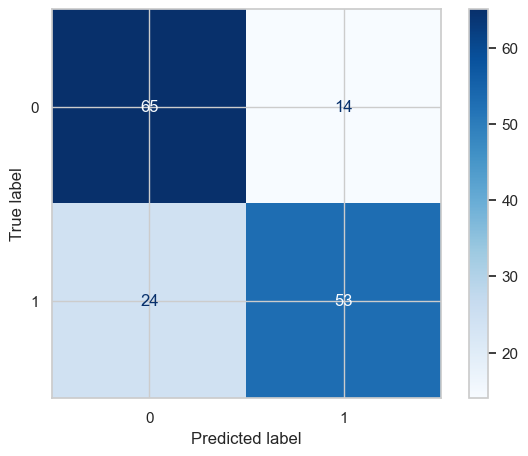

In [43]:
confmat = ConfusionMatrixDisplay.from_estimator(dt_base, X_test, y_test, cmap="Blues")

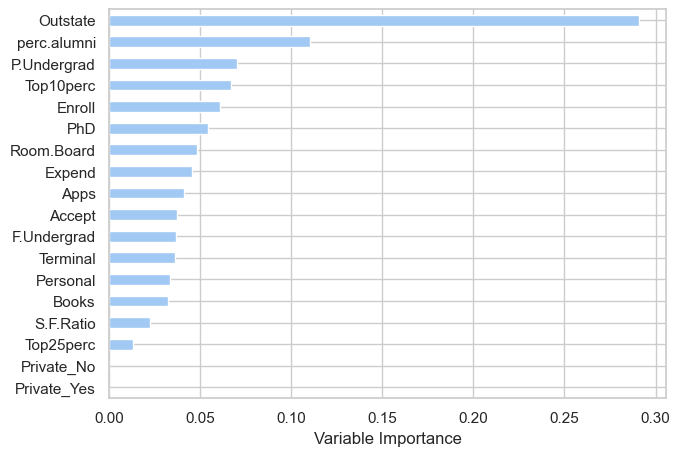

In [44]:
Importance = pd.DataFrame({'Importance':dt_base.feature_importances_}, index=X.columns)
Importance.sort_values('Importance', axis=0, ascending=True).plot(kind='barh',  color='b',linewidth = 1 )
plt.xlabel('Variable Importance')
plt.gca().legend_ = None
plt.show()

In [45]:
dt_base2 = DecisionTreeClassifier(max_depth=5, random_state=21)
dt_base2.fit(X_train, y_train)
model_pred = dt_base2.predict(X_test)

In [46]:
score = dt_base2.score(X_test, y_test) * 100
print(f'{score:.2f}')
precision = precision_score(y_test, model_pred) * 100
print(f'{precision:.2f}')
recall = recall_score(y_test, model_pred) * 100
print(f'{recall:.2f}')

75.00
77.14
70.13


In [47]:
plt.rcParams['text.color'] = 'black'
plt.figure(figsize=(32, 20), dpi=400)

plot_tree(dt_base2, 
          filled=True, 
          rounded=True,
          fontsize=14,
          proportion=False,
          class_names=["Low Grad Rate", "High Grad Rate"], 
          feature_names=X_train.columns.values); 

In [48]:
ccp_alphas

array([0.        , 0.00147611, 0.00148644, 0.00154029, 0.00154589,
       0.00158254, 0.00214707, 0.00214707, 0.00214707, 0.00241546,
       0.00257649, 0.00263505, 0.00268384, 0.00268384, 0.00268384,
       0.00268384, 0.00276052, 0.00276052, 0.00278527, 0.00283762,
       0.00288395, 0.00292783, 0.00309674, 0.00311126, 0.00338164,
       0.00356683, 0.00364853, 0.00396269, 0.00406352, 0.00415397,
       0.00425905, 0.00428021, 0.00429415, 0.00429415, 0.00438361,
       0.00442483, 0.00460087, 0.00461133, 0.0047566 , 0.00476829,
       0.0048647 , 0.00488843, 0.00554318, 0.00566851, 0.00581455,
       0.00585566, 0.00609304, 0.00679514, 0.00824088, 0.00827499,
       0.0132528 , 0.01392426, 0.01860402, 0.03537302, 0.12801018])

In [49]:
# Define parameter grid
param_grid = {
'criterion': ['gini', 'entropy', 'log_loss'],
'max_depth': [None, 3,4,5,6,7,8,9,10, 12, 15],
'max_features': [None, 'sqrt', 'log2'],
'ccp_alpha': ccp_alphas
}
# Create a decision tree model
dt_opt = DecisionTreeClassifier(random_state=21)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=5, random_state=21)
# Perform grid search cross-validation
grid_search = GridSearchCV(estimator=dt_opt, param_grid=param_grid, cv=cv, scoring='accuracy', n_jobs =-1)
grid_search.fit(X_train,y_train)

print("tuned hyperparameters: ",grid_search.best_params_)
print("accuracy: ",grid_search.best_score_)

C:\Users\dohrm\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
90750 fits failed out of a total of 272250.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
90750 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\dohrm\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\dohrm\anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 937, in fit
    super().fit(
  File "C:\Users\dohrm\anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 352, in fit
    criterion = CRITERIA_CLF[self.criterion](
KeyError: 'log_loss'

  warnings.warn(some_fits

tuned hyperparameters:  {'ccp_alpha': 0.0, 'criterion': 'entropy', 'max_depth': 3, 'max_features': None}
accuracy:  0.7594111623143881


C:\Users\dohrm\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:969: UserWarning: One or more of the test scores are non-finite: [0.6827957  0.67730159 0.67730159 ...        nan        nan        nan]
  warnings.warn(


In [50]:
dt_best_tested = DecisionTreeClassifier(random_state=21, ccp_alpha=0.0, criterion='entropy', max_depth=3, max_features=None)
dt_best_tested.fit(X_train, y_train)
model_pred = dt_best_tested.predict(X_train)

In [51]:
score = dt_best_tested.score(X_train, y_train) * 100
print(f'{score:.2f}')
precision = precision_score(y_train, model_pred) * 100
print(f'{precision:.2f}')
recall = recall_score(y_train, model_pred) * 100
print(f'{recall:.2f}')

80.68
85.66
73.46


In [52]:
score = dt_best_tested.score(X_train, y_train) * 100
print(f'{score:.2f}')
precision = precision_score(y_train, model_pred) * 100
print(f'{precision:.2f}')
recall = recall_score(y_train, model_pred) * 100
print(f'{recall:.2f}')

80.68
85.66
73.46


In [54]:
model_pred = dt_best_tested.predict(X_test)
score = dt_best_tested.score(X_test, y_test) * 100
print(f'{score:.2f}')
precision = precision_score(y_test, model_pred) * 100
print(f'{precision:.2f}')
recall = recall_score(y_test, model_pred) * 100
print(f'{recall:.2f}')

75.64
81.97
64.94


In [55]:
print(classification_report(y_test, model_pred))

              precision    recall  f1-score   support

           0       0.72      0.86      0.78        79
           1       0.82      0.65      0.72        77

    accuracy                           0.76       156
   macro avg       0.77      0.76      0.75       156
weighted avg       0.77      0.76      0.75       156



Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

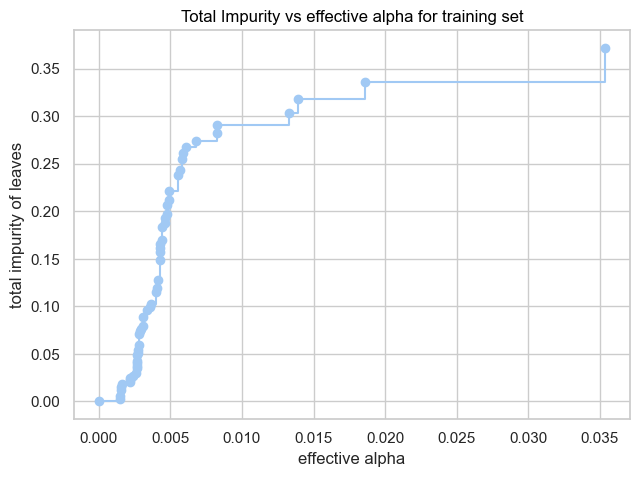

In [56]:
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [57]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(X_train, y_train)
    clfs.append(clf)

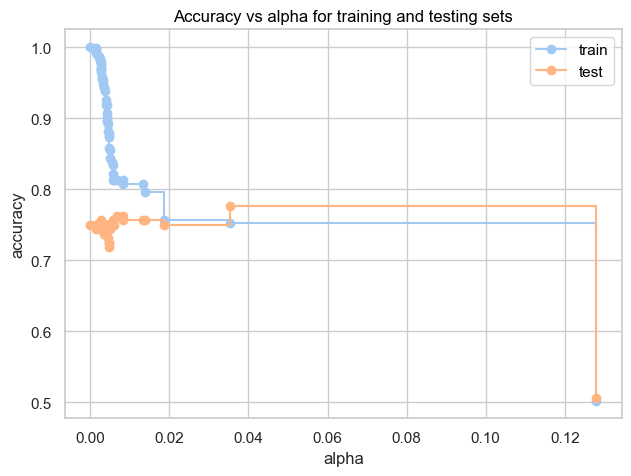

In [58]:
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [59]:
dt_best = DecisionTreeClassifier(random_state=21, ccp_alpha=0.02, criterion='entropy', max_depth=3, max_features=None)
dt_best.fit(X_train, y_train)
model_pred = dt_best.predict(X_train)

In [60]:
score = dt_best.score(X_train, y_train) * 100
print(f'{score:.2f}')
precision = precision_score(y_train, model_pred) * 100
print(f'{precision:.2f}')
recall = recall_score(y_train, model_pred) * 100
print(f'{recall:.2f}')

80.68
85.66
73.46


In [61]:
model_pred = dt_best.predict(X_test)
score = dt_best.score(X_test, y_test) * 100
print(f'{score:.2f}')
precision = precision_score(y_test, model_pred) * 100
print(f'{precision:.2f}')
recall = recall_score(y_test, model_pred) * 100
print(f'{recall:.2f}')

75.64
81.97
64.94


In [62]:
print(classification_report(y_test, model_pred))

              precision    recall  f1-score   support

           0       0.72      0.86      0.78        79
           1       0.82      0.65      0.72        77

    accuracy                           0.76       156
   macro avg       0.77      0.76      0.75       156
weighted avg       0.77      0.76      0.75       156



In [63]:
plt.rcParams['text.color'] = 'black'
plt.figure(figsize=(32, 20), dpi=400)

plot_tree(dt_best, 
          filled=True, 
          rounded=True,
          fontsize=14,
          proportion=False,
          class_names=["Low Grad Rate", "High Grad Rate"], 
          feature_names=X_train.columns.values);

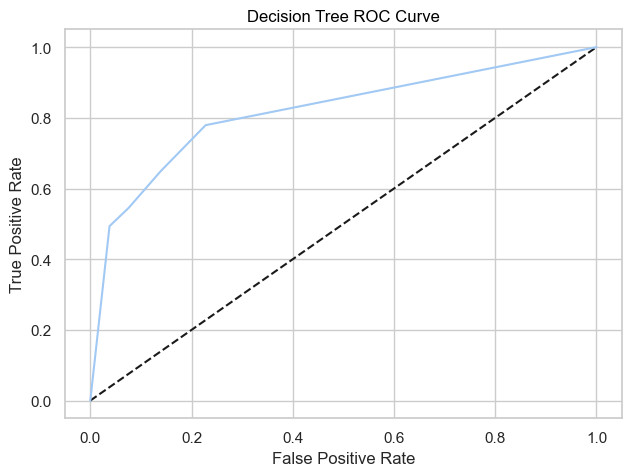

ROC AUC Score: 0.8171


In [64]:
y_pred_prob = dt_best.predict_proba(X_test)[:,1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

plt.plot([0, 1], [0, 1],'k--')
plt.plot(fpr, tpr, label='Logistic Regression')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Decision Tree ROC Curve')
plt.show();

# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, model_pred)


roc_auc = roc_auc_score(y_test, y_pred_prob)
roc_auc_format = 'ROC AUC Score: {0:.4f}'.format(roc_auc)
print(roc_auc_format)

# Random Forest Classification

### Restore "Grad.Rate" column and resplit data:

In [86]:
df["Grad.Rate"] = savedGradRate

In [87]:
df.head()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate,Private_No,Private_Yes
0,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60,False,True
1,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56,False,True
2,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54,False,True
3,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59,False,True
4,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15,False,True


In [88]:
X = df.drop('Grad.Rate', axis = 1) #keep features only for X
y = df['Grad.Rate'] #keep target variable only for y

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [89]:
sc = StandardScaler()

In [90]:
sc.fit(X_train)

#transform the train data
X_train_sc = sc.transform(X_train)
X_train_sc = pd.DataFrame(X_train_sc, columns=X_train.columns)

#transform the test data
X_test_sc = sc.transform(X_test)
X_test_sc = pd.DataFrame(X_test_sc, columns=X_test.columns)

In [91]:
# Replacing with scaled test/train predictors 
X_train = X_train_sc
X_test = X_test_sc

In [92]:
y_train = y_train.reset_index(drop=True) 
X_train = X_train.reset_index(drop=True)

### Ridge Regression:

iteration 0.0001 done
iteration 0.0005 done
iteration 0.001 done
iteration 0.005 done
iteration 0.01 done
iteration 0.05 done
iteration 0.1 done
iteration 0.25 done
iteration 0.5 done
iteration 10 done
iteration 50 done
iteration 100 done
iteration 150 done
iteration 200 done
iteration 250 done
iteration 500 done


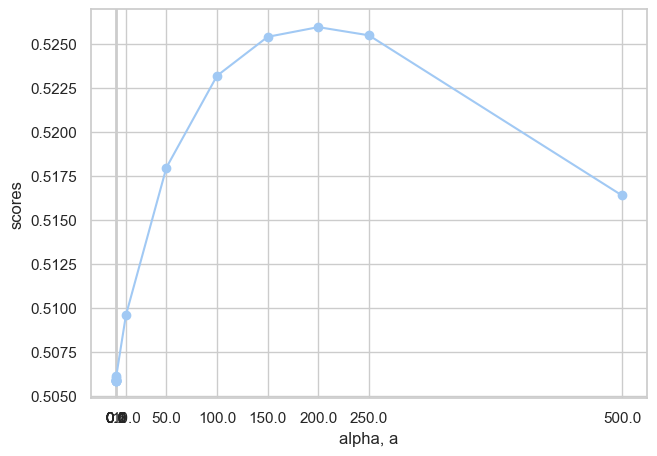

In [93]:
#Inspect which best lambda/alpha value range to use before grid search:
alphas = [0.0001, 0.0005, 0.001, 0.005, 0.01,  0.05, 0.1, 0.25, 0.5, 10, 50, 100, 150, 200, 250, 500]
scores = []

for a in alphas:
    ridge = Ridge(alpha = a, fit_intercept=True)
    ridge.fit(X_train, y_train)
    scores.append(ridge.score(X_test, y_test))
    print("iteration {} done".format(a))


plt.plot(alphas, scores, '-o')
plt.xlabel('alpha, a')
plt.ylabel('scores')
plt.xticks(alphas)
plt.show()

iteration 10 done
iteration 50 done
iteration 100 done
iteration 125 done
iteration 150 done
iteration 175 done
iteration 200 done
iteration 225 done
iteration 250 done
iteration 275 done
iteration 500 done


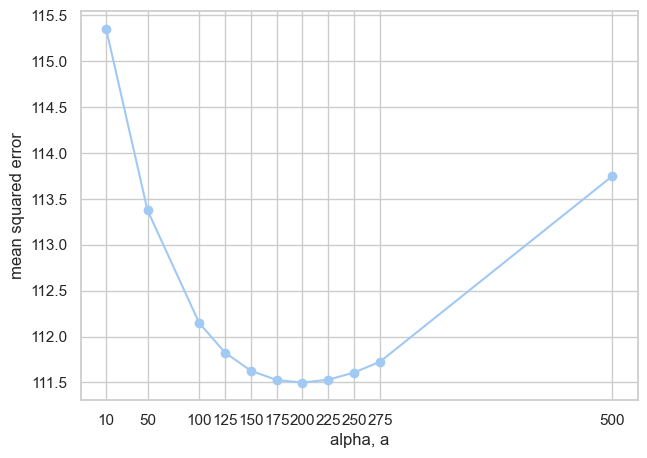

In [94]:
# On inspection: lambda range around 150 in alpha value.
alphas = [10, 50, 100, 125, 150, 175, 200, 225, 250, 275, 500]
scores = []

for a in alphas:
    ridge = Ridge(alpha = a, fit_intercept=True)
    ridge.fit(X_train, y_train)
    pred_test=ridge.predict(X_test)
    scores.append(mean_squared_error(y_test, pred_test))
    print("iteration {} done".format(a))


plt.plot(alphas, scores, '-o')
plt.xlabel('alpha, a')
plt.ylabel('mean squared error')
plt.xticks(alphas)
plt.show()

In [95]:
#Similar result in lower mean square error, thus grid search would focus alpha values of 150-250 for optimal lambda value
ridge_model = Ridge(fit_intercept=True, max_iter=5000)

#Define model evaluation method (K = 5, repeats = 5)
cv = RepeatedKFold(n_splits = 5, n_repeats = 5, random_state = 42)

#Defining grid
grid = dict()
grid['alpha'] = arange(50, 250, 1)

#Defining search (scoring = 'neg_mean_squared_error')
search = GridSearchCV(ridge_model, grid, scoring = 'neg_mean_squared_error', cv = cv, n_jobs=-1)
#Perform the search with testing data
result = search.fit(X_train, y_train)

In [96]:
print('Config: %s' % result.best_params_)

Config: {'alpha': 92}


In [97]:
ridge = Ridge(alpha = 92, fit_intercept=True)
ridge.fit(X_train, y_train)

# Create a dataframe with the coefficients
names = X.columns
ridge_coef = ridge.coef_
df_ridge = pd.DataFrame([ridge_coef])

df_ridge.columns = names
df_ridge = df_ridge.T
df_ridge=df_ridge.rename(columns = {0:'corr_ridge_coeff'})# corr_ridge_coeff is corresponding ridge coefficients of the variable
pd.options.display.float_format = '{:.3f}'.format
df_ridge

,corr_ridge_coeff
Apps,2.381
Accept,0.917
Enroll,0.018
Top10perc,1.486
Top25perc,2.263
F.Undergrad,-0.967
P.Undergrad,-2.070
Outstate,2.883
Room.Board,1.910
Books,-0.536


In [98]:
#Ridge prediction using X_test and y_test

ridge_pred = ridge.predict(X_test)
y_hat_test = ridge_pred

#Predict: RMSE
test_mse = mean_squared_error(y_test, y_hat_test)
test_rmse = np.sqrt(test_mse)

#Predict: R^2
test_r_squared = r2_score(y_test, y_hat_test)

#Predict: MAPE
test_mape = mean_absolute_percentage_error(y_test, y_hat_test)

print(f'Test RMSE is:\t{test_rmse}')
print(f'Test R^2 is:\t{round(test_r_squared, 3)}')
print(f'Test MAPE is:\t{round(test_mape, 2)}')

Test RMSE is:	10.596506929325782
Test R^2 is:	0.523
Test MAPE is:	0.14


In [99]:
df_ridge['Variable_Names'] = df_ridge.index

print(f"Graduation Rate = {ridge.intercept_:.2f} + ", end="")
for x in range (0, len(df_ridge['Variable_Names'])):
    print(f"({df_ridge['Variable_Names'][x]} * {df_ridge['corr_ridge_coeff'][x]:.2f})", end="")
    if (x + 1) < len(df_ridge['Variable_Names']):
        print(" + ", end="")

Graduation Rate = 65.29 + (Apps * 2.38) + (Accept * 0.92) + (Enroll * 0.02) + (Top10perc * 1.49) + (Top25perc * 2.26) + (F.Undergrad * -0.97) + (P.Undergrad * -2.07) + (Outstate * 2.88) + (Room.Board * 1.91) + (Books * -0.54) + (Personal * -1.17) + (PhD * 1.13) + (Terminal * -0.60) + (S.F.Ratio * 0.05) + (perc.alumni * 3.17) + (Expend * -1.25) + (Private_No * -0.88) + (Private_Yes * 0.88)

In [100]:
df_ridge['Variable_Names'] = df_ridge.index

print(f"Graduation Rate = {ridge.intercept_:.2f} + ", end="")
for x in range (0, len(df_ridge['Variable_Names'])):
    print(f"({df_ridge['Variable_Names'][x]} * {df_ridge['corr_ridge_coeff'][x]:.2f})", end="")
    if (x + 1) < len(df_ridge['Variable_Names']):
        print(" + ", end="")

Graduation Rate = 65.29 + (Apps * 2.38) + (Accept * 0.92) + (Enroll * 0.02) + (Top10perc * 1.49) + (Top25perc * 2.26) + (F.Undergrad * -0.97) + (P.Undergrad * -2.07) + (Outstate * 2.88) + (Room.Board * 1.91) + (Books * -0.54) + (Personal * -1.17) + (PhD * 1.13) + (Terminal * -0.60) + (S.F.Ratio * 0.05) + (perc.alumni * 3.17) + (Expend * -1.25) + (Private_No * -0.88) + (Private_Yes * 0.88)

In [103]:
# Create residual dataframe
ridge_y_residuals = pd.DataFrame(y_test.reset_index())
df_ridge_pred = pd.DataFrame(ridge_pred)
ridge_y_residuals = pd.concat([ridge_y_residuals, df_ridge_pred], axis = 1)
ridge_y_residuals = ridge_y_residuals.rename(columns = {0:'ridge_pred'})
ridge_y_residuals['ridge_resid'] = ridge_y_residuals['Grad.Rate'] - ridge_y_residuals['ridge_pred']
ridge_y_residuals.head()

,index,Grad.Rate,ridge_pred,ridge_resid
0,568,66,56.961,9.039
1,530,45,49.848,-4.848
2,610,54,56.216,-2.216
3,109,73,70.120,2.880
4,586,43,55.554,-12.554


In [104]:
#Ridge residual visualization goes here
ridge_y_residuals.rename(columns={'Grad.Rate': 'Actual Graduation Rate', 'ridge_pred': 'Predicted Graduation Rate'}, inplace=True)
ridge_y_residuals.head()

,index,Actual Graduation Rate,Predicted Graduation Rate,ridge_resid
0,568,66,56.961,9.039
1,530,45,49.848,-4.848
2,610,54,56.216,-2.216
3,109,73,70.120,2.880
4,586,43,55.554,-12.554


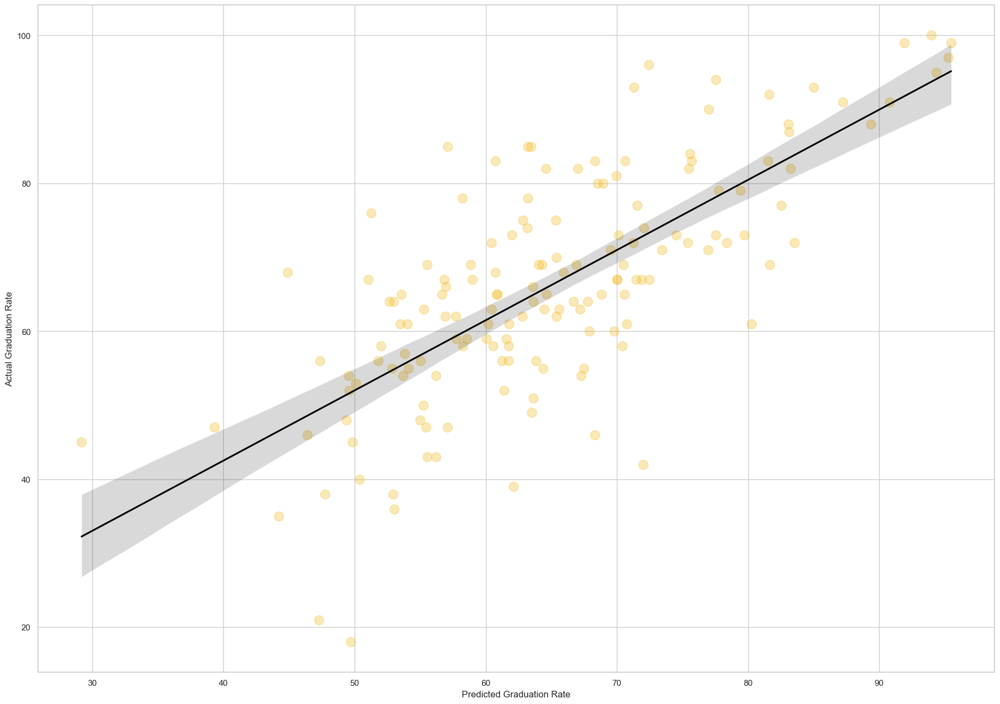

In [105]:
sns.set(style='whitegrid')
plt.figure(figsize=(20,15)) # changes area of scatterplot
sns.regplot(x='Predicted Graduation Rate', y='Actual Graduation Rate', data = ridge_y_residuals,
            scatter_kws={"color":"#f2be2e","alpha":0.35,"s":150}, line_kws={'color': 'black'});

# Random Forest Regression